# Modeling - LSTM

In this notebook I will be exploring two LSTM models with different scaling methods for their variables. I will also be evaluating these models using the timeseriessplit function for validation. The models will also be tuned according to gridsearches done for the best hyperparameters. Based on the previous models and their performance, I will not be including the Dew Point on these models to start.

<a class="anchor" id="content"></a>
### Table of Contents
* [Model #6: LSTM w/Std Scaling](#Model6)
    + [Model #6: Metrics](#Model6M)
    + [Model #6.1: Tuned Hyperparameters](#Model6.1)
    + [Model #6.1: Metrics](#Model6.1M)
    + [Model #6.2: Tuned Hyperparameters](#Model6.2)
    + [Model #6.2: Metrics](#Model6.2M)
* [Model #7: LSTM w/MinMax Scaling](#Model7)
    + [Model #7: Metrics](#Model7M)
    + [Model #7.1: Tuned Hyperparameters](#Model7.1)
    + [Model #7.1: Metrics](#Model7.1M)
* [Choosing a Model](#choose)
* [Final Models](#ModelF)

In [48]:
# Data Handling and Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Modeling
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import Pipeline
from tensorflow.keras.regularizers import l2
from sklearn.base import BaseEstimator, TransformerMixin

# Model Tuning and Evaluation Metrics
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
df = pd.read_csv('../data/weatherstats_vancouver_hourly_clean.csv')
df.head()

,date_time_local,pressure_station,pressure_sea,wind_dir,wind_speed,wind_gust,relative_humidity,dew_point,temperature,windchill,humidex,visibility,health_index,cloud_okta,max_air_temp_pst1hr,min_air_temp_pst1hr
0,2013-07-01 00:00:00,101.18,101.16,SSE,7,0.0,91,18.2,19.7,0.0,0.0,32200.0,2.9,5.0,19.4,18.5
1,2013-07-01 01:00:00,101.22,101.21,SE,6,0.0,89,17.8,19.6,0.0,0.0,32200.0,3.0,5.0,20.1,18.7
2,2013-07-01 02:00:00,101.26,101.24,E,11,0.0,88,16.7,18.7,0.0,0.0,32200.0,3.0,5.0,19.8,18.0
3,2013-07-01 03:00:00,101.26,101.25,E,4,0.0,84,16.5,19.2,0.0,0.0,32200.0,2.7,5.0,18.5,17.5
4,2013-07-01 04:00:00,101.30,101.28,NNW,5,0.0,87,15.7,17.9,0.0,0.0,32200.0,2.6,5.0,18.8,17.3


In [3]:
# Setting date to index.
df['date_time_local'] = pd.to_datetime(df['date_time_local'], utc=False)
df = df.set_index('date_time_local')
df.head()

,pressure_station,pressure_sea,wind_dir,wind_speed,wind_gust,relative_humidity,dew_point,temperature,windchill,humidex,visibility,health_index,cloud_okta,max_air_temp_pst1hr,min_air_temp_pst1hr
date_time_local,,,,,,,,,,,,,,,
2013-07-01 00:00:00,101.18,101.16,SSE,7,0.0,91,18.2,19.7,0.0,0.0,32200.0,2.9,5.0,19.4,18.5
2013-07-01 01:00:00,101.22,101.21,SE,6,0.0,89,17.8,19.6,0.0,0.0,32200.0,3.0,5.0,20.1,18.7
2013-07-01 02:00:00,101.26,101.24,E,11,0.0,88,16.7,18.7,0.0,0.0,32200.0,3.0,5.0,19.8,18.0
2013-07-01 03:00:00,101.26,101.25,E,4,0.0,84,16.5,19.2,0.0,0.0,32200.0,2.7,5.0,18.5,17.5
2013-07-01 04:00:00,101.30,101.28,NNW,5,0.0,87,15.7,17.9,0.0,0.0,32200.0,2.6,5.0,18.8,17.3


In [4]:
# Double checking the date index is set.
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 87648 entries, 2013-07-01 00:00:00 to 2023-06-30 23:00:00
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pressure_station     87648 non-null  float64
 1   pressure_sea         87648 non-null  float64
 2   wind_dir             87648 non-null  object 
 3   wind_speed           87648 non-null  int64  
 4   wind_gust            87648 non-null  float64
 5   relative_humidity    87648 non-null  int64  
 6   dew_point            87648 non-null  float64
 7   temperature          87648 non-null  float64
 8   windchill            87648 non-null  float64
 9   humidex              87648 non-null  float64
 10  visibility           87648 non-null  float64
 11  health_index         87648 non-null  float64
 12  cloud_okta           87648 non-null  float64
 13  max_air_temp_pst1hr  87648 non-null  float64
 14  min_air_temp_pst1hr  87648 non-null  float64
dtypes

I will be creating the functions to be used on all models in this jupyter notebook beforehand. This will help keep data cleaner and less repetitive.

In [5]:
# Function for model initializing.
def initialize_model(lstm_units, dense_activation, recurrent_regularizer=None):
    model = Sequential()
    model.add(InputLayer(input_shape=(1, 9)))  # Add an input layer with the correct input shape
    model.add(LSTM(lstm_units, recurrent_regularizer=recurrent_regularizer))  # Pass recurrent_regularizer here
    model.add(Dense(8, activation=dense_activation))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

In [6]:
# Function for data preprocessing indlucing scaling and reshaping.
def preprocess_data(X, y, train_index, test_index, scaler_type):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    if scaler_type == 'minmax':
        scaler = MinMaxScaler()
    elif scaler_type == 'standard':
        scaler = StandardScaler()
    else:
        raise ValueError("Invalid scaler_type")
    
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
    X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

    return X_train_reshaped, X_test_reshaped, y_train, y_test, X_train.index, X_test.index

In [7]:
# Function to create a data frame for the predicted results.
def create_data_frame(index, y_true, y_pred, data_type):
    return pd.DataFrame({
        'Date': index,
        f'Predicted_{data_type}': y_pred.flatten(),
        f'Actual_{data_type}': y_true.values
    }).set_index('Date')

In [8]:
# Function for model evaluation.
def evaluate_model(y_true, y_pred, data_type):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"{data_type} MAE: {mae}")
    print(f"{data_type} MSE: {mse}")
    print(f"{data_type} RMSE: {rmse}")
    print(f"{data_type} R^2: {r2}")

##### [***To Top***](#content)

<a class="anchor" id="Model6"></a>
## Model #6: LSTM with Standard Scaling

In [9]:
# I will begin by dropping the same columns as with earlier models, including dew point.
model_6_X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir', 'dew_point'], axis=1)
model_6_y = df['temperature']

In [10]:
# Initializings TimeSeriesSplit with 4 splits, this keeps the dates from June to July in each split.
tscv = TimeSeriesSplit(n_splits=4)

# Defining the LSTM model
model_6 = initialize_model(128, 'relu')
model_6.summary()

# Initializing an empty dictionary to store the DataFrames for each split
split_data_frames_6 = {}

# For loop through splits to fit, predict, and evalute model #6
for split_num, (train_index, test_index) in enumerate(tscv.split(model_6_X), start=1):
    print("Running Split:", split_num)
    X_train_reshaped_6, X_test_reshaped_6, y_train_6, y_test_6, train_dates_6, test_dates_6 = preprocess_data(model_6_X, model_6_y, train_index, test_index, scaler_type='standard')

    # Compile and fit LSTM model
    model_6.fit(X_train_reshaped_6, y_train_6, epochs=25, batch_size=32, verbose=0)  # Modify epochs and batch_size as needed

    # Make predictions
    y_train_pred_6 = model_6.predict(X_train_reshaped_6)
    y_test_pred_6 = model_6.predict(X_test_reshaped_6)

    # Create DataFrame for this split's train data
    train_df_6 = create_data_frame(train_dates_6, y_train_6, y_train_pred_6, 'Train')
    test_df_6 = create_data_frame(test_dates_6, y_test_6, y_test_pred_6, 'Test')

    split_data_frames_6[f'Split_{split_num}'] = {'Train': train_df_6, 'Test': test_df_6}
    
    print(f"Split {split_num}: Training data date range: {train_dates_6.min()} to {train_dates_6.max()}")
    evaluate_model(y_train_6, y_train_pred_6, 'Train')
    print()

    # Evaluate on test data
    print(f"Split {split_num}: Test data date range: {test_dates_6.min()} to {test_dates_6.max()}")
    evaluate_model(y_test_6, y_test_pred_6, 'Test')
    print()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 128)               70656     
_________________________________________________________________
dense (Dense)                (None, 8)                 1032      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 71,697
Trainable params: 71,697
Non-trainable params: 0
_________________________________________________________________
Running Split: 1
Split 1: Training data date range: 2013-07-01 00:00:00 to 2015-07-01 11:00:00
Train MAE: 2.4297913629093344
Train MSE: 10.64059247969448
Train RMSE: 3.2619921029479024
Train R^2: 0.7325220369866758

Split 1: Test data date range: 2015-07-01 12:00:00 to 2017-06-30 20:00:00
Test MAE: 2.790151191765614
Test MSE: 13.48575840518941
Test RMSE: 3.6722960672022906
Test R

##### [***To Top***](#content)

<a class="anchor" id="Model6M"></a>
### Model 6 Metrics

| Metric      | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.444            | 2.456            | 2.458            | 2.521            |
| Test MAE    | 2.779            | 2.694            | 3.006            | 2.937            |
| Train MSE   | 10.770           | 10.658           | 10.807           | 11.322           |
| Test MSE    | 13.448           | 13.099           | 15.324           | 15.476           |
| Train RMSE  | 3.282            | 3.265            | 3.287            | 3.365            |
| Test RMSE   | 3.667            | 3.619            | 3.915            | 3.934            |
| Train R^2   | 0.729            | 0.727            | 0.728            | 0.710            |
| Test R^2    | 0.647            | 0.682            | 0.587            | 0.660            |

The metrics for model #6 do not seem better than previous models. The MAE, MSE, and RSME metrics seem to indicate several errors to the predictions. The R-squared values are also indicating a low percentage of accurate predictions. However, I need to visualiza the predicted vs. actual values to ascertain if this is a good model for lowest and highest temperature predictions.

In [11]:
# Creating dataframe for each split, train and test using the previous split dataframes dictionary:
train_df1_6 = split_data_frames_6['Split_1']['Train']

test_df1_6 = split_data_frames_6['Split_1']['Test']

train_df2_6 = split_data_frames_6['Split_2']['Train']

test_df2_6 = split_data_frames_6['Split_2']['Test']

train_df3_6 = split_data_frames_6['Split_3']['Train']

test_df3_6 = split_data_frames_6['Split_3']['Test']

train_df4_6 = split_data_frames_6['Split_4']['Train']

test_df4_6 = split_data_frames_6['Split_4']['Test']

In [12]:
# I am printing the first line of each dataframe to make sure thhe predicted and actual values are correctly displayed.
print(train_df1_6.head(1))
print(test_df1_6.head(1))
print(train_df2_6.head(1))
print(test_df2_6.head(1))
print(train_df3_6.head(1))
print(test_df3_6.head(1))
print(train_df4_6.head(1))
print(test_df4_6.head(1))

            Predicted_Train  Actual_Train
Date                                     
2013-07-01        14.576123          19.7
                     Predicted_Test  Actual_Test
Date                                            
2015-07-01 12:00:00       22.304434         21.6
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        14.249173          19.7
                     Predicted_Test  Actual_Test
Date                                            
2017-06-30 21:00:00       20.440882         20.8
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        14.015811          19.7
                     Predicted_Test  Actual_Test
Date                                            
2019-07-01 06:00:00       15.740632         13.5
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        14.452905          19.7
                     Predicted_Test  Actual_Test
Date  

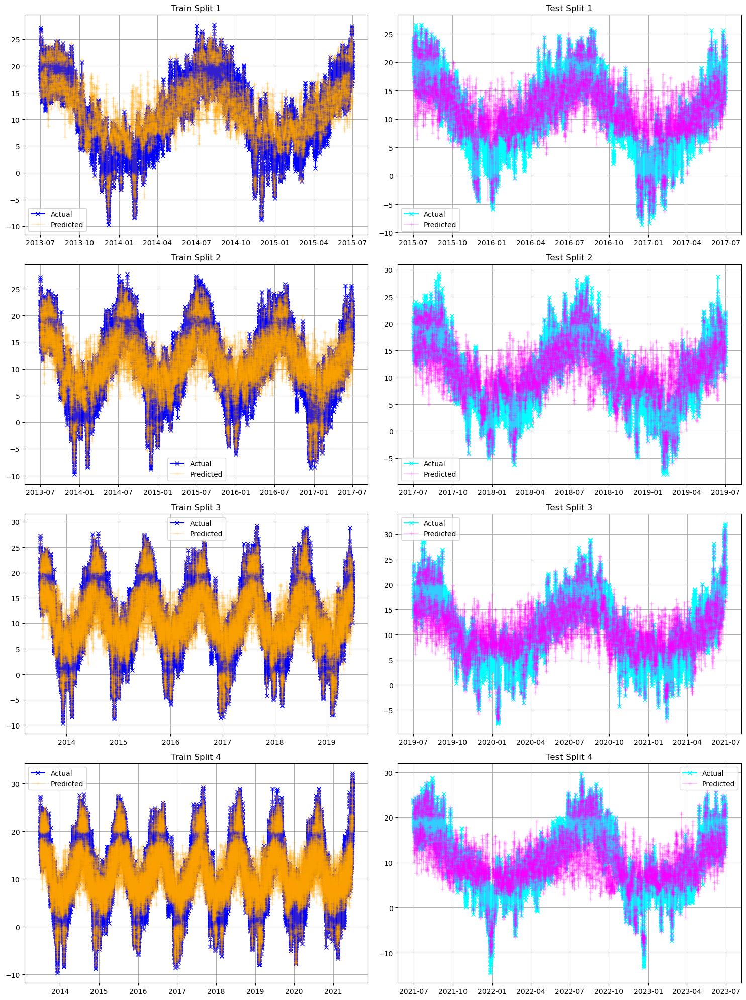

In [13]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()  # flatten the 2D array to 1D for easier indexing

train_dfs_6 = [train_df1_6, train_df2_6, train_df3_6, train_df4_6]
test_dfs_6 = [test_df1_6, test_df2_6, test_df3_6, test_df4_6]

# Pairing the train and test dataframes for each split
paired_dfs_6 = [(train, test) for train, test in zip(train_dfs_6, test_dfs_6)]

# For loop through the train and test dataframes
for i, (train_df, test_df) in enumerate(paired_dfs_6):
    # Plotting the train dataframe
    if 'Predicted_Train' in train_df.columns and 'Actual_Train' in train_df.columns:
        axes[2*i].plot(train_df.index, train_df['Actual_Train'], label='Actual', marker='x', color='blue')
        axes[2*i].plot(train_df.index, train_df['Predicted_Train'], label='Predicted', marker='+',color='orange', alpha = 0.2)
        axes[2*i].set_title(f'Train Split {i+1}')
        axes[2*i].legend()
        axes[2*i].grid(True)
    
    # Plotting the test dataframe
    if 'Predicted_Test' in test_df.columns and 'Actual_Test' in test_df.columns:
        axes[2*i + 1].plot(test_df.index, test_df['Actual_Test'], label='Actual', marker='x', color='cyan')
        axes[2*i + 1].plot(test_df.index, test_df['Predicted_Test'], label='Predicted', marker='+', color='magenta', alpha = 0.2)
        axes[2*i + 1].set_title(f'Test Split {i+1}')
        axes[2*i + 1].legend()
        axes[2*i + 1].grid(True)

plt.tight_layout()
plt.show()


Based on the visualizations above the predicted values in the test data are close to the highest and lowest actual temperatures. However, the predicted values on the rest of the temperatures do not seem to be as accurate, which offers an explanation to the metrics I discussed above. 

I will be evaluating and tuning this model, but first I will run Model #7 with the MinMax Scaler to see if the results improve.

##### [***To Top***](#content)

<a class="anchor" id="Model7"></a>
## Model #7: LSTM with MinMax Scaling

In [15]:
# To keep things separate and clear, I'm creating new variables for X and y to use for model #7
model_7_X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir', 'dew_point'], axis=1)
model_7_y = df['temperature']

In [16]:
# Defining the LSTM model
model_7 = initialize_model(128, 'relu')
model_7.summary()

# Initializing empty dictionary to store DataFrames for each split
split_data_frames_7 = {}

# For loop through splits to fit, predict, and evalute model #7
for split_num, (train_index, test_index) in enumerate(tscv.split(model_7_X), start=1):
    print("Running Split:", split_num)
    X_train_reshaped_7, X_test_reshaped_7, y_train_7, y_test_7, train_dates_7, test_dates_7 = preprocess_data(model_7_X, model_7_y, train_index, test_index, scaler_type='minmax')

    # Compile and fit LSTM model
    model_7.fit(X_train_reshaped_7, y_train_7, epochs=25, batch_size=32, verbose=0)  # Modify epochs and batch_size as needed

    # Make predictions
    y_train_pred_7 = model_7.predict(X_train_reshaped_7)
    y_test_pred_7 = model_7.predict(X_test_reshaped_7)

    # Create DataFrame for each split train and test data
    train_df_7 = create_data_frame(train_dates_7, y_train_7, y_train_pred_7, 'Train')
    test_df_7 = create_data_frame(test_dates_7, y_test_7, y_test_pred_7, 'Test')

    split_data_frames_7[f'Split_{split_num}'] = {'Train': train_df_7, 'Test': test_df_7}
    
    print(f"Split {split_num}: Training data date range: {train_dates_7.min()} to {train_dates_7.max()}")
    evaluate_model(y_train_7, y_train_pred_7, 'Train')
    print()

    # Evaluate on test data
    print(f"Split {split_num}: Test data date range: {test_dates_7.min()} to {test_dates_7.max()}")
    evaluate_model(y_test_7, y_test_pred_7, 'Test')
    print()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 128)               70656     
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 1032      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 9         
Total params: 71,697
Trainable params: 71,697
Non-trainable params: 0
_________________________________________________________________
Running Split: 1
Split 1: Training data date range: 2013-07-01 00:00:00 to 2015-07-01 11:00:00
Train MAE: 2.7883585058018387
Train MSE: 13.127752762442569
Train RMSE: 3.6232240839399608
Train R^2: 0.6700010291211247

Split 1: Test data date range: 2015-07-01 12:00:00 to 2017-06-30 20:00:00
Test MAE: 2.912555147802204
Test MSE: 14.198368860242637
Test RMSE: 3.7680723002939627
Te

##### [***To Top***](#content)

<a class="anchor" id="Model7M"></a>
### Model #7 Metrics

| Metric      | Split 1  | Split 2  | Split 3  | Split 4  |
|-------------|----------|----------|----------|----------|
| Train MAE   | 2.9204   | 2.6839   | 2.6168   | 2.7243   |
| Test MAE    | 2.9789   | 2.8627   | 2.9361   | 2.9944   |
| Train MSE   | 13.8834  | 12.3565  | 11.9931  | 12.7128  |
| Test MSE    | 14.5424  | 14.8287  | 14.6598  | 15.6579  |
| Train RMSE  | 3.7260   | 3.5152   | 3.4631   | 3.5655   |
| Test RMSE   | 3.8134   | 3.8508   | 3.8288   | 3.9570   |
| Train R^2   | 0.6510   | 0.6831   | 0.6983   | 0.6749   |
| Test R^2    | 0.6188   | 0.6402   | 0.6052   | 0.6560   |

The metrics for model #7 are very similar to those of Model #6. They also indicate several errors on the predictions and a low amount of correct predictions. I will proceed with the visualization of the predicted vs. actual values.

In [17]:
# Creating dataframe for each split, train and test using the dictionary.
train_df1_7 = split_data_frames_7['Split_1']['Train']

test_df1_7 = split_data_frames_7['Split_1']['Test']

train_df2_7 = split_data_frames_7['Split_2']['Train']

test_df2_7 = split_data_frames_7['Split_2']['Test']

train_df3_7 = split_data_frames_7['Split_3']['Train']

test_df3_7 = split_data_frames_7['Split_3']['Test']

train_df4_7 = split_data_frames_7['Split_4']['Train']

test_df4_7 = split_data_frames_7['Split_4']['Test']

In [18]:
print(train_df1_7.head(1))
print(test_df1_7.head(1))
print(train_df2_7.head(1))
print(test_df2_7.head(1))
print(train_df3_7.head(1))
print(test_df3_7.head(1))
print(train_df4_7.head(1))
print(test_df4_7.head(1))

            Predicted_Train  Actual_Train
Date                                     
2013-07-01        10.781409          19.7
                     Predicted_Test  Actual_Test
Date                                            
2015-07-01 12:00:00       21.211184         21.6
            Predicted_Train  Actual_Train
Date                                     
2013-07-01         9.746546          19.7
                     Predicted_Test  Actual_Test
Date                                            
2017-06-30 21:00:00       20.752686         20.8
            Predicted_Train  Actual_Train
Date                                     
2013-07-01         9.891273          19.7
                     Predicted_Test  Actual_Test
Date                                            
2019-07-01 06:00:00       15.150651         13.5
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        10.234202          19.7
                     Predicted_Test  Actual_Test
Date  

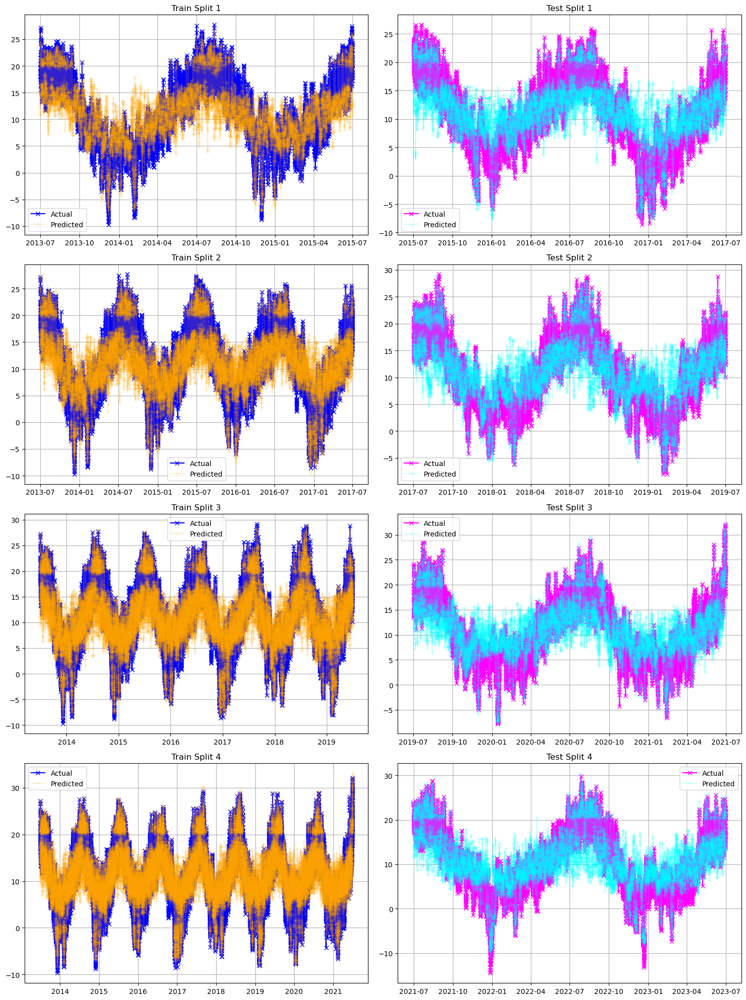

In [19]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()

train_dfs_7 = [train_df1_7, train_df2_7, train_df3_7, train_df4_7]
test_dfs_7 = [test_df1_7, test_df2_7, test_df3_7, test_df4_7]

# Pairing the train and test dataframes for each split
paired_dfs_7 = [(train, test) for train, test in zip(train_dfs_7, test_dfs_7)]

# For loop through the train and test dataframes
for i, (train_df, test_df) in enumerate(paired_dfs_7):
    # Plotting the train dataframe
    if 'Predicted_Train' in train_df.columns and 'Actual_Train' in train_df.columns:
        axes[2*i].plot(train_df.index, train_df['Actual_Train'], label='Actual', marker='x', color='blue')
        axes[2*i].plot(train_df.index, train_df['Predicted_Train'], label='Predicted', marker='+', color='orange', alpha = 0.2)
        axes[2*i].set_title(f'Train Split {i+1}')
        axes[2*i].legend()
        axes[2*i].grid(True)
    
    # Plotting the test dataframe
    if 'Predicted_Test' in test_df.columns and 'Actual_Test' in test_df.columns:
        axes[2*i + 1].plot(test_df.index, test_df['Actual_Test'], label='Actual', marker='x', color='magenta')
        axes[2*i + 1].plot(test_df.index, test_df['Predicted_Test'], label='Predicted', marker='+', color='cyan', alpha = 0.2)
        axes[2*i + 1].set_title(f'Test Split {i+1}')
        axes[2*i + 1].legend()
        axes[2*i + 1].grid(True)

plt.tight_layout()
plt.show()


This model is similarly good at predicting the highest and lowest temperatures. However, it seems that it is also missing the mark on the rest of the temperatures, predicting mostly higher temperatures for actual temperatures under 5ºC

##### [***To Top***](#content)

<a class="anchor" id="Model7.1"></a>
### Model #7.1: Hypertuned Parameters

I will be running a gridsearch to tune Model #7. The grid search is computationally expensive and does take some time (about 1.5-2 hours to run on my PC).

In [30]:
# def create_model(neurons=64, activation='relu', recurrent_regularizer_value=0.01):
#     model = Sequential()
#     model.add(InputLayer(input_shape=(1, 9)))  # 1 timestep, 9 features
#     model.add(LSTM(neurons, recurrent_regularizer=l2(recurrent_regularizer_value)))  # Using l2 regularizer here
#     model.add(Dense(8, activation=activation))
#     model.add(Dense(1, activation='linear'))
#     model.compile(loss='mean_squared_error', optimizer='adam')
#     return model

# class ReshapeTransformer(BaseEstimator, TransformerMixin):
#     def __init__(self, new_shape):
#         self.new_shape = new_shape

#     def fit(self, X, y=None):
#         return self

#     def transform(self, X, y=None):
#         return np.reshape(X, (self.new_shape))
    
# model = KerasRegressor(build_fn=create_model, epochs=25, batch_size=32, verbose=0)

# # create pipeline
# estimators_model_7_1 = []
# estimators_model_7_1.append(('standardize', MinMaxScaler()))
# estimators_model_7_1.append(('reshaper', ReshapeTransformer(new_shape=(-1, 1, 9))))
# estimators_model_7_1.append(('mlp', model))
# pipeline_model_7_1 = Pipeline(estimators_model_7_1)

# param_grid_model_7_1 = {
#     'mlp__neurons': [32, 64, 128],
#     'mlp__recurrent_regularizer_value': [0.01, 0.001, 0.0001],  # These will be passed to the l2 regularizer
#     'mlp__batch_size': [32, 64],
# }

# grid_model_7_1 = GridSearchCV(estimator=pipeline_model_7_1, param_grid=param_grid_model_7_1, cv=tscv, verbose=1)
# grid_result_model_7_1 = grid_model_7_1.fit(model_7_X, model_7_y)
# print("Best: %f using %s" % (grid_result_model_7_1.best_score_, grid_result_model_7_1.best_params_))

Fitting 4 folds for each of 18 candidates, totalling 72 fits
Best: -15.200804 using {'mlp__batch_size': 32, 'mlp__neurons': 128, 'mlp__recurrent_regularizer_value': 0.01}


GridSearch on Model #7 was done using the following parameters:
</br>
- Neurons: 32, 64, and 128
- l2 regularization values: 0.01, 0.001, and 0.0001
- Batch Sizes: 32 and 64
</br>
Fitting 4 folds for each of 18 candidates, totalling 72 fits 
</br>
</br>
The best parameter combination is 128 neurons, l2 of 0.01, and a batch size of 32.
</br>
</br>
Please note, I decided to use l2 regularization as it is often used to deal with overfitting. While my models are not overfitting the R-squared values tend to be higher on the train data than the test data. I am hoping the use of l2 will help reduce this gap between the R-squared values.

In [20]:
# Defining the LSTM model 7.1 per the gridsearch parameters above.
model_7_1 = initialize_model(128, 'relu', recurrent_regularizer=l2(0.01))
model_7_1.summary()

# Initializing empty dictionary to store DataFrames for each split
split_data_frames_7_1 = {}

# For loop through splits to fit, predict, and evalute model #7.1
for split_num, (train_index, test_index) in enumerate(tscv.split(model_7_X), start=1):
    print("Running Split:", split_num)
    X_train_reshaped_7_1, X_test_reshaped_7_1, y_train_7_1, y_test_7_1, train_dates_7_1, test_dates_7_1 = preprocess_data(model_7_X, model_7_y, train_index, test_index, scaler_type='minmax')

    # Compile and fit LSTM model
    model_7_1.fit(X_train_reshaped_7_1, y_train_7_1, epochs=25, batch_size=32, verbose=0)  # Modify epochs and batch_size as needed

    # Make predictions
    y_train_pred_7_1 = model_7_1.predict(X_train_reshaped_7_1)
    y_test_pred_7_1 = model_7_1.predict(X_test_reshaped_7_1)

    # Create DataFrame for this split's train data
    train_df_7_1 = create_data_frame(train_dates_7_1, y_train_7_1, y_train_pred_7_1, 'Train')
    test_df_7_1 = create_data_frame(test_dates_7_1, y_test_7_1, y_test_pred_7_1, 'Test')

    split_data_frames_7_1[f'Split_{split_num}'] = {'Train': train_df_7_1, 'Test': test_df_7_1}
    
    print(f"Split {split_num}: Training data date range: {train_dates_7_1.min()} to {train_dates_7_1.max()}")
    evaluate_model(y_train_7_1, y_train_pred_7_1, 'Train')
    print()

    # Evaluate on test data
    print(f"Split {split_num}: Test data date range: {test_dates_7_1.min()} to {test_dates_7_1.max()}")
    evaluate_model(y_test_7_1, y_test_pred_7_1, 'Test')
    print()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 128)               70656     
_________________________________________________________________
dense_4 (Dense)              (None, 8)                 1032      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 9         
Total params: 71,697
Trainable params: 71,697
Non-trainable params: 0
_________________________________________________________________
Running Split: 1
Split 1: Training data date range: 2013-07-01 00:00:00 to 2015-07-01 11:00:00
Train MAE: 2.7602431962881924
Train MSE: 12.99087153410965
Train RMSE: 3.6042851627069754
Train R^2: 0.6734418818931034

Split 1: Test data date range: 2015-07-01 12:00:00 to 2017-06-30 20:00:00
Test MAE: 2.999273394523242
Test MSE: 15.07694779901625
Test RMSE: 3.8829045570315337
Test

##### [***To Top***](#content)

<a class="anchor" id="Model7.1M"></a>
### Model #7.1 Metrics

| Metric      | Split 1     | Split 2     | Split 3     | Split 4     |
|-------------|-------------|-------------|-------------|-------------|
| Train MAE   | 2.8043      | 2.7405      | 2.6694      | 2.7320      |
| Test MAE    | 3.0052      | 2.8639      | 2.9865      | 2.9715      |
| Train MSE   | 13.1663     | 12.5793     | 12.2931     | 12.6950     |
| Test MSE    | 14.9395     | 14.5149     | 14.8087     | 15.2444     |
| Train RMSE  | 3.6285      | 3.5467      | 3.5062      | 3.5630      |
| Test RMSE   | 3.8652      | 3.8098      | 3.8482      | 3.9044      |
| Train R^2   | 0.6690      | 0.6774      | 0.6907      | 0.6753      |
| Test R^2    | 0.6084      | 0.6479      | 0.6012      | 0.6651      |


There isn't a lot of change in the metrics from model #7.1 and model #7. The metrics for Model #7.1 still indicate errors in the predictions, and they are only off by a few decimals from the model #7 metrics.

In [21]:
# Creating dataframe for each split, train and test:
train_df1_7_1 = split_data_frames_7_1['Split_1']['Train']

test_df1_7_1 = split_data_frames_7_1['Split_1']['Test']

train_df2_7_1 = split_data_frames_7_1['Split_2']['Train']

test_df2_7_1 = split_data_frames_7_1['Split_2']['Test']

train_df3_7_1 = split_data_frames_7_1['Split_3']['Train']

test_df3_7_1 = split_data_frames_7_1['Split_3']['Test']

train_df4_7_1 = split_data_frames_7_1['Split_4']['Train']

test_df4_7_1 = split_data_frames_7_1['Split_4']['Test']

In [22]:
print(train_df1_7_1.head(1))
print(test_df1_7_1.head(1))
print(train_df2_7_1.head(1))
print(test_df2_7_1.head(1))
print(train_df3_7_1.head(1))
print(test_df3_7_1.head(1))
print(train_df4_7_1.head(1))
print(test_df4_7_1.head(1))

            Predicted_Train  Actual_Train
Date                                     
2013-07-01        11.696928          19.7
                     Predicted_Test  Actual_Test
Date                                            
2015-07-01 12:00:00       20.869879         21.6
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        10.247758          19.7
                     Predicted_Test  Actual_Test
Date                                            
2017-06-30 21:00:00       20.425821         20.8
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        11.142293          19.7
                     Predicted_Test  Actual_Test
Date                                            
2019-07-01 06:00:00       15.352256         13.5
            Predicted_Train  Actual_Train
Date                                     
2013-07-01         9.984754          19.7
                     Predicted_Test  Actual_Test
Date  

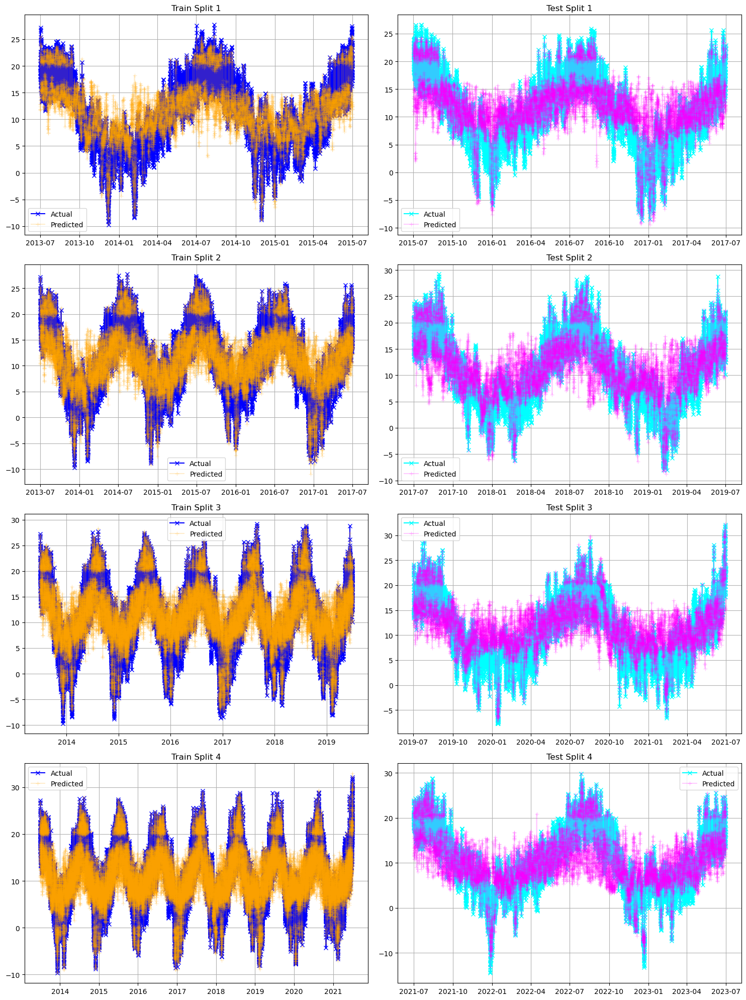

In [23]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()

train_dfs_7_1 = [train_df1_7_1, train_df2_7_1, train_df3_7_1, train_df4_7_1]
test_dfs_7_1 = [test_df1_7_1, test_df2_7_1, test_df3_7_1, test_df4_7_1]

# Pairing the train and test dataframes for each split
paired_dfs_7_1 = [(train, test) for train, test in zip(train_dfs_7_1, test_dfs_7_1)]

# For loop through the train and test dataframes
for i, (train_df, test_df) in enumerate(paired_dfs_7_1):
    # Plotting the train dataframe
    if 'Predicted_Train' in train_df.columns and 'Actual_Train' in train_df.columns:
        axes[2*i].plot(train_df.index, train_df['Actual_Train'], label='Actual', marker='x', color='blue')
        axes[2*i].plot(train_df.index, train_df['Predicted_Train'], label='Predicted', marker='+', color='orange', alpha = 0.2)
        axes[2*i].set_title(f'Train Split {i+1}')
        axes[2*i].legend()
        axes[2*i].grid(True)
    
    # Plotting the test dataframe
    if 'Predicted_Test' in test_df.columns and 'Actual_Test' in test_df.columns:
        axes[2*i + 1].plot(test_df.index, test_df['Actual_Test'], label='Actual', marker='x', color='cyan')
        axes[2*i + 1].plot(test_df.index, test_df['Predicted_Test'], label='Predicted', marker='+', color='magenta', alpha = 0.2)
        axes[2*i + 1].set_title(f'Test Split {i+1}')
        axes[2*i + 1].legend()
        axes[2*i + 1].grid(True)

plt.tight_layout()
plt.show()

The predicted vs. actual values for model #7.1 do look a little better than model #7. However, in split 1 and 2 of the the predictions are not in line with the highest temperatures. The general observation so far is that the more data the model, gets the better it is performing, but that is to be expected.
</br></br>
I will proceed with model #6 and tune the model to see if I can get a better performing model.

##### [***To Top***](#content)

<a class="anchor" id="Model6.1"></a>
## Model #6.1: Hypertuned Parameters

In [105]:
# # create pipeline
# estimators_model_6_1 = []
# estimators_model_6_1.append(('standardize', StandardScaler()))
# estimators_model_6_1.append(('reshaper', ReshapeTransformer(new_shape=(-1, 1, 9))))
# estimators_model_6_1.append(('mlp', model))
# pipeline_model_6_1 = Pipeline(estimators_model_6_1)

# param_grid_model_6_1 = {
#     'mlp__neurons': [32, 64, 128],
#     'mlp__activation': ['relu', 'tanh'],
#     'mlp__epochs': [20, 30],
#     'mlp__batch_size': [32, 64],
# }

# grid_model_6_1 = GridSearchCV(estimator=pipeline_model_6_1, param_grid=param_grid_model_6_1, cv=tscv, verbose=1)
# grid_result_model_6_1 = grid_model_6_1.fit(model_6_X, model_6_y)
# print("Best: %f using %s" % (grid_result_model_6_1.best_score_, grid_result_model_6_1.best_params_))

First GridSearch on Model #6 was done using the following parameters:
</br>
- Neurons: 32, 64, and 128,
- Activation: relu and tanh
- Epochs: 20 and 30
- Batch_size: 32 and 64
</br></br>
Fitting 4 folds for each of 12 candidates, totalling 48 fits
</br></br>
The best parameter combination is 128 neurons, relu activation, 30 epoch, and a batch size of 32.

In [24]:
# Defining LSTM model based on the above hypertuned parameters.
model_6_1 = initialize_model(128, 'relu')
model_6_1.summary()

# Initializing empty dictionary to store DataFrames for each split
split_data_frames_6_1 = {}

# For loop through splits to fit, predict, and evalute model #6.1
for split_num, (train_index, test_index) in enumerate(tscv.split(model_6_X), start=1):
    print("Running Split:", split_num)
    X_train_reshaped_6_1, X_test_reshaped_6_1, y_train_6_1, y_test_6_1, train_dates_6_1, test_dates_6_1 = preprocess_data(model_6_X, model_6_y, train_index, test_index, scaler_type='standard')

    # Compile and fit LSTM model
    model_6_1.fit(X_train_reshaped_6_1, y_train_6_1, epochs=25, batch_size=32, verbose=0)  # Modify epochs and batch_size as needed

    # Make predictions
    y_train_pred_6_1 = model_6_1.predict(X_train_reshaped_6_1)
    y_test_pred_6_1 = model_6_1.predict(X_test_reshaped_6_1)

    # Create DataFrame for this split's train data
    train_df_6_1 = create_data_frame(train_dates_6_1, y_train_6_1, y_train_pred_6_1, 'Train')
    test_df_6_1 = create_data_frame(test_dates_6_1, y_test_6_1, y_test_pred_6_1, 'Test')

    split_data_frames_6_1[f'Split_{split_num}'] = {'Train': train_df_6_1, 'Test': test_df_6_1}
    
    print(f"Split {split_num}: Training data date range: {train_dates_6_1.min()} to {train_dates_6_1.max()}")
    evaluate_model(y_train_6_1, y_train_pred_6_1, 'Train')
    print()

    # Evaluate on test data
    print(f"Split {split_num}: Test data date range: {test_dates_6_1.min()} to {test_dates_6_1.max()}")
    evaluate_model(y_test_6_1, y_test_pred_6_1, 'Test')
    print()


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 128)               70656     
_________________________________________________________________
dense_6 (Dense)              (None, 8)                 1032      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 9         
Total params: 71,697
Trainable params: 71,697
Non-trainable params: 0
_________________________________________________________________
Running Split: 1
Split 1: Training data date range: 2013-07-01 00:00:00 to 2015-07-01 11:00:00
Train MAE: 2.440605628647347
Train MSE: 10.6011001761043
Train RMSE: 3.2559330730382494
Train R^2: 0.7335147750263258

Split 1: Test data date range: 2015-07-01 12:00:00 to 2017-06-30 20:00:00
Test MAE: 2.7382427234267865
Test MSE: 13.01140061966217
Test RMSE: 3.6071319104881887
Test 

##### [***To Top***](#content)

<a class="anchor" id="Model6.1M"></a>
### Model 6.1 Metrics

| Metric      | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.422            | 2.421            | 2.428            | 2.529            |
| Test MAE    | 2.796            | 2.725            | 2.974            | 2.954            |
| Train MSE   | 10.476           | 10.598           | 10.619           | 11.243           |
| Test MSE    | 13.450           | 13.546           | 15.043           | 15.618           |
| Train RMSE  | 3.237            | 3.255            | 3.259            | 3.353            |
| Test RMSE   | 3.237            | 3.255            | 3.259            | 3.353            |
| Train R^2   | 0.737            | 0.728            | 0.733            | 0.712            |
| Test R^2    | 0.647            | 0.671            | 0.595            | 0.657            |

Model #6.1 is performind similarly to the other models based on these metrics. I will review the visualization as well to see if this model is the best so far.

In [25]:
# Creating dataframe for each split, train and test:
train_df1_6_1 = split_data_frames_6_1['Split_1']['Train']

test_df1_6_1 = split_data_frames_6_1['Split_1']['Test']

train_df2_6_1 = split_data_frames_6_1['Split_2']['Train']

test_df2_6_1 = split_data_frames_6_1['Split_2']['Test']

train_df3_6_1 = split_data_frames_6_1['Split_3']['Train']

test_df3_6_1 = split_data_frames_6_1['Split_3']['Test']

train_df4_6_1 = split_data_frames_6_1['Split_4']['Train']

test_df4_6_1 = split_data_frames_6_1['Split_4']['Test']

In [26]:
print(train_df1_6_1.head(1))
print(test_df1_6_1.head(1))
print(train_df2_6_1.head(1))
print(test_df2_6_1.head(1))
print(train_df3_6_1.head(1))
print(test_df3_6_1.head(1))
print(train_df4_6_1.head(1))
print(test_df4_6_1.head(1))

            Predicted_Train  Actual_Train
Date                                     
2013-07-01        12.941893          19.7
                     Predicted_Test  Actual_Test
Date                                            
2015-07-01 12:00:00       22.240828         21.6
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        13.887924          19.7
                     Predicted_Test  Actual_Test
Date                                            
2017-06-30 21:00:00       21.273951         20.8
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        13.171187          19.7
                     Predicted_Test  Actual_Test
Date                                            
2019-07-01 06:00:00       14.103484         13.5
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        13.425514          19.7
                     Predicted_Test  Actual_Test
Date  

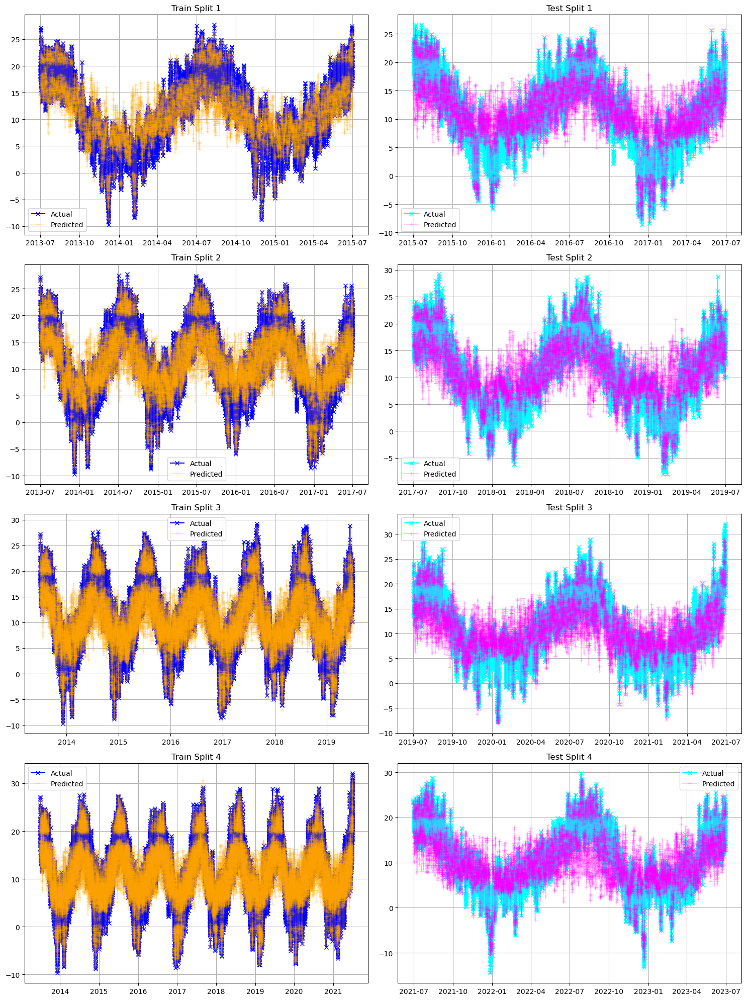

In [27]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()

train_dfs_6_1 = [train_df1_6_1, train_df2_6_1, train_df3_6_1, train_df4_6_1]
test_dfs_6_1 = [test_df1_6_1, test_df2_6_1, test_df3_6_1, test_df4_6_1]

# Pairing train and test dataframes for each split
paired_dfs_6_1 = [(train, test) for train, test in zip(train_dfs_6_1, test_dfs_6_1)]

# For loop through the train and test dataframes
for i, (train_df, test_df) in enumerate(paired_dfs_6_1):
    # Plotting the train dataframe
    if 'Predicted_Train' in train_df.columns and 'Actual_Train' in train_df.columns:
        axes[2*i].plot(train_df.index, train_df['Actual_Train'], label='Actual', marker='x', color='blue')
        axes[2*i].plot(train_df.index, train_df['Predicted_Train'], label='Predicted', marker='+', color='orange', alpha = 0.2)
        axes[2*i].set_title(f'Train Split {i+1}')
        axes[2*i].legend()
        axes[2*i].grid(True)
    
    # Plotting the test dataframe
    if 'Predicted_Test' in test_df.columns and 'Actual_Test' in test_df.columns:
        axes[2*i + 1].plot(test_df.index, test_df['Actual_Test'], label='Actual', marker='x', color='cyan')
        axes[2*i + 1].plot(test_df.index, test_df['Predicted_Test'], label='Predicted', marker='+', color='magenta', alpha = 0.2)
        axes[2*i + 1].set_title(f'Test Split {i+1}')
        axes[2*i + 1].legend()
        axes[2*i + 1].grid(True)

plt.tight_layout()
plt.show()

The visualization does not provide a definitive answer on this being the best model. However, the lowest and highest temperature predictions are on average correct.

##### [***To Top***](#content)

<a class="anchor" id="Model6.2"></a>
## Model #6.2: Hypertuned Parameters

In [ ]:
# # create pipeline
# estimators_model_6_2 = []
# estimators_model_6_2.append(('standardize', StandardScaler()))
# estimators_model_6_2.append(('reshaper', ReshapeTransformer(new_shape=(-1, 1, 9))))
# estimators_model_6_2.append(('mlp', model))
# pipeline_model_6_2 = Pipeline(estimators_model_6_2)

# # time series cross-validator
# tscv = TimeSeriesSplit(n_splits=4)

# param_grid_model_6_2 = {
#     'mlp__neurons': [32, 64, 128],
#     'mlp__recurrent_regularizer_value': [0.01, 0.001, 0.0001],  # These will be passed to the l2 regularizer
#     'mlp__batch_size': [32, 64],
# }

# grid_model_6_2 = GridSearchCV(estimator=pipeline_model_6_2, param_grid=param_grid_model_6_2, cv=tscv, verbose=1)
# grid_result_model_6_2 = grid_model_6_2.fit(model_6_X, model_6_y)
# print("Best: %f using %s" % (grid_result_model_6_2.best_score_, grid_result_model_6_2.best_params_))

Second GridSearch on Model #6 was done using the following parameters:
</br>
- Neurons: 32, 64, and 128
- l2 c-value: 0.01, 0.001, and 0.0001
- Batch_size: 32 and64
</br></br>
Fitting 4 folds for each of 18 candidates, totalling 72 fits
</br></br>
The best parameter combination is are 64 neurons, batch size of 32 and l2 c-value of 0.01.

In [28]:
# Defining LSTM model with above hypertuned parameters. Keeping the activation as relu per last grid search.
model_6_2 = initialize_model(64, 'relu', recurrent_regularizer=l2(0.01))
model_6_2.summary()

# Initializing empty dictionary to store DataFrames for each split
split_data_frames_6_2 = {}

# For loop through splits to fit, predict, and evalute model #6.2
for split_num, (train_index, test_index) in enumerate(tscv.split(model_6_X), start=1):
    print("Running Split:", split_num)
    X_train_reshaped_6_2, X_test_reshaped_6_2, y_train_6_2, y_test_6_2, train_dates_6_2, test_dates_6_2 = preprocess_data(model_6_X, model_6_y, train_index, test_index, scaler_type='standard')

    # Compile and fit LSTM model
    model_6_2.fit(X_train_reshaped_6_2, y_train_6_2, epochs=25, batch_size=32, verbose=0)  # Modify epochs and batch_size as needed

    # Make predictions
    y_train_pred_6_2 = model_6_2.predict(X_train_reshaped_6_2)
    y_test_pred_6_2 = model_6_2.predict(X_test_reshaped_6_2)

    # Create DataFrame for this split's train data
    train_df_6_2 = create_data_frame(train_dates_6_2, y_train_6_2, y_train_pred_6_2, 'Train')
    test_df_6_2 = create_data_frame(test_dates_6_2, y_test_6_2, y_test_pred_6_2, 'Test')

    split_data_frames_6_2[f'Split_{split_num}'] = {'Train': train_df_6_2, 'Test': test_df_6_2}
    
    print(f"Split {split_num}: Training data date range: {train_dates_6_2.min()} to {train_dates_6_2.max()}")
    evaluate_model(y_train_6_2, y_train_pred_6_2, 'Train')
    print()

    # Evaluate on test data
    print(f"Split {split_num}: Test data date range: {test_dates_6_2.min()} to {test_dates_6_2.max()}")
    evaluate_model(y_test_6_2, y_test_pred_6_2, 'Test')
    print()


Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 64)                18944     
_________________________________________________________________
dense_8 (Dense)              (None, 8)                 520       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 9         
Total params: 19,473
Trainable params: 19,473
Non-trainable params: 0
_________________________________________________________________
Running Split: 1
Split 1: Training data date range: 2013-07-01 00:00:00 to 2015-07-01 11:00:00
Train MAE: 2.476641428094428
Train MSE: 10.743930931373923
Train RMSE: 3.277793607195841
Train R^2: 0.7299243659820851

Split 1: Test data date range: 2015-07-01 12:00:00 to 2017-06-30 20:00:00
Test MAE: 2.754311792177498
Test MSE: 12.998634825917515
Test RMSE: 3.6053619549107014
Test

##### [***To Top***](#content)

<a class="anchor" id="Model6.2M"></a>
### Model 6.2 Metrics:

| Metric      | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.445            | 2.459            | 2.451            | 2.552            |
| Test MAE    | 2.811            | 2.713            | 2.971            | 2.960            |
| Train MSE   | 10.451           | 10.614           | 10.802           | 11.493           |
| Test MSE    | 13.380           | 13.157           | 15.177           | 15.588           |
| Train RMSE  | 3.233            | 3.258            | 3.287            | 3.390            |
| Test RMSE   | 3.233            | 3.258            | 3.287            | 3.390            |
| Train R^2   | 0.737            | 0.728            | 0.728            | 0.706            |
| Test R^2    | 0.649            | 0.681            | 0.591            | 0.658            |

The metrics for model #6.2 are very similar to the rest of the models in this notebook, but still lower than model #6.1.

In [29]:
# Creating dataframe for each split, train and test:
train_df1_6_2 = split_data_frames_6_2['Split_1']['Train']

test_df1_6_2 = split_data_frames_6_2['Split_1']['Test']

train_df2_6_2 = split_data_frames_6_2['Split_2']['Train']

test_df2_6_2 = split_data_frames_6_2['Split_2']['Test']

train_df3_6_2 = split_data_frames_6_2['Split_3']['Train']

test_df3_6_2 = split_data_frames_6_2['Split_3']['Test']

train_df4_6_2 = split_data_frames_6_2['Split_4']['Train']

test_df4_6_2 = split_data_frames_6_2['Split_4']['Test']

In [30]:
print(train_df1_6_2.head(1))
print(test_df1_6_2.head(1))
print(train_df2_6_2.head(1))
print(test_df2_6_2.head(1))
print(train_df3_6_2.head(1))
print(test_df3_6_2.head(1))
print(train_df4_6_2.head(1))
print(test_df4_6_2.head(1))

            Predicted_Train  Actual_Train
Date                                     
2013-07-01        12.484599          19.7
                     Predicted_Test  Actual_Test
Date                                            
2015-07-01 12:00:00       21.848999         21.6
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        11.875397          19.7
                     Predicted_Test  Actual_Test
Date                                            
2017-06-30 21:00:00       20.650476         20.8
            Predicted_Train  Actual_Train
Date                                     
2013-07-01        11.659129          19.7
                     Predicted_Test  Actual_Test
Date                                            
2019-07-01 06:00:00       14.748836         13.5
            Predicted_Train  Actual_Train
Date                                     
2013-07-01         12.30666          19.7
                     Predicted_Test  Actual_Test
Date  

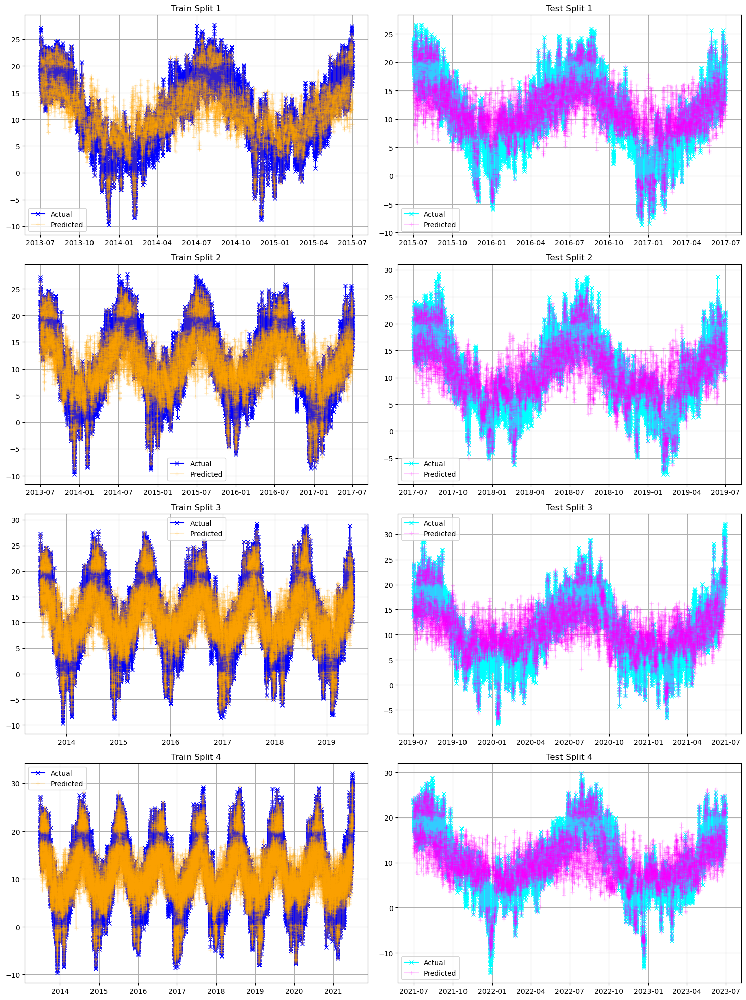

In [31]:
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()  # flatten the 2D array to 1D for easier indexing

train_dfs_6_2 = [train_df1_6_2, train_df2_6_2, train_df3_6_2, train_df4_6_2]
test_dfs_6_2 = [test_df1_6_2, test_df2_6_2, test_df3_6_2, test_df4_6_2]

# Pair train and test dataframes for each split
paired_dfs_6_2 = [(train, test) for train, test in zip(train_dfs_6_2, test_dfs_6_2)]

# Loop through the train and test dataframes
for i, (train_df, test_df) in enumerate(paired_dfs_6_2):
    # Plot the train dataframe
    if 'Predicted_Train' in train_df.columns and 'Actual_Train' in train_df.columns:
        axes[2*i].plot(train_df.index, train_df['Actual_Train'], label='Actual', marker='x', color='blue')
        axes[2*i].plot(train_df.index, train_df['Predicted_Train'], label='Predicted', marker='+', color='orange',alpha = 0.2)
        axes[2*i].set_title(f'Train Split {i+1}')
        axes[2*i].legend()
        axes[2*i].grid(True)
    
    # Plot the test dataframe
    if 'Predicted_Test' in test_df.columns and 'Actual_Test' in test_df.columns:
        axes[2*i + 1].plot(test_df.index, test_df['Actual_Test'], label='Actual', marker='x', color='cyan')
        axes[2*i + 1].plot(test_df.index, test_df['Predicted_Test'], label='Predicted', marker='+', color='magenta', alpha = 0.2)
        axes[2*i + 1].set_title(f'Test Split {i+1}')
        axes[2*i + 1].legend()
        axes[2*i + 1].grid(True)

plt.tight_layout()
plt.show()

Per the visualization above, the model is not doing well in predicting the highest and lowest temperatures in split 4, which is where it has the most data to train on. This is something I will consider as I pick the model to push into production.

##### [***To Top***](#content)

<a class="anchor" id="choose"></a>
## Choosing a Model

When visualized model #6.1 performed slightly better on the test data for highest and lowest temperatures. From a metrics standpoint I will be comparing all of the metrics for the models. I am placing the metrics below so they can be viewed and compared more easily.

| Model #6    | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.444            | 2.456            | 2.458            | 2.521            |
| Test MAE    | 2.779            | 2.694            | 3.006            | 2.937            |
| Train MSE   | 10.770           | 10.658           | 10.807           | 11.322           |
| Test MSE    | 13.448           | 13.099           | 15.324           | 15.476           |
| Train RMSE  | 3.282            | 3.265            | 3.287            | 3.365            |
| Test RMSE   | 3.667            | 3.619            | 3.915            | 3.934            |
| Train R^2   | 0.729            | 0.727            | 0.728            | 0.710            |
| Test R^2    | 0.647            | 0.682            | 0.587            | 0.660            |


| Model #6.1  | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.422            | 2.421            | 2.428            | 2.529            |
| Test MAE    | 2.796            | 2.725            | 2.974            | 2.954            |
| Train MSE   | 10.476           | 10.598           | 10.619           | 11.243           |
| Test MSE    | 13.450           | 13.546           | 15.043           | 15.618           |
| Train RMSE  | 3.237            | 3.255            | 3.259            | 3.353            |
| Test RMSE   | 3.237            | 3.255            | 3.259            | 3.353            |
| Train R^2   | 0.737            | 0.728            | 0.733            | 0.712            |
| Test R^2    | 0.647            | 0.671            | 0.595            | 0.657            |

| Model #6.2  | Split 1          | Split 2          | Split 3          | Split 4          |
|-------------|------------------|------------------|------------------|------------------|
| Train MAE   | 2.445            | 2.459            | 2.451            | 2.552            |
| Test MAE    | 2.811            | 2.713            | 2.971            | 2.960            |
| Train MSE   | 10.451           | 10.614           | 10.802           | 11.493           |
| Test MSE    | 13.380           | 13.157           | 15.177           | 15.588           |
| Train RMSE  | 3.233            | 3.258            | 3.287            | 3.390            |
| Test RMSE   | 3.233            | 3.258            | 3.287            | 3.390            |
| Train R^2   | 0.737            | 0.728            | 0.728            | 0.706            |
| Test R^2    | 0.649            | 0.681            | 0.591            | 0.658            |


| Model #7    | Split 1  | Split 2  | Split 3  | Split 4  |
|-------------|----------|----------|----------|----------|
| Train MAE   | 2.9204   | 2.6839   | 2.6168   | 2.7243   |
| Test MAE    | 2.9789   | 2.8627   | 2.9361   | 2.9944   |
| Train MSE   | 13.8834  | 12.3565  | 11.9931  | 12.7128  |
| Test MSE    | 14.5424  | 14.8287  | 14.6598  | 15.6579  |
| Train RMSE  | 3.7260   | 3.5152   | 3.4631   | 3.5655   |
| Test RMSE   | 3.8134   | 3.8508   | 3.8288   | 3.9570   |
| Train R^2   | 0.6510   | 0.6831   | 0.6983   | 0.6749   |
| Test R^2    | 0.6188   | 0.6402   | 0.6052   | 0.6560   |

| Model #7.1  | Split 1     | Split 2     | Split 3     | Split 4     |
|-------------|-------------|-------------|-------------|-------------|
| Train MAE   | 2.8043      | 2.7405      | 2.6694      | 2.7320      |
| Test MAE    | 3.0052      | 2.8639      | 2.9865      | 2.9715      |
| Train MSE   | 13.1663     | 12.5793     | 12.2931     | 12.6950     |
| Test MSE    | 14.9395     | 14.5149     | 14.8087     | 15.2444     |
| Train RMSE  | 3.6285      | 3.5467      | 3.5062      | 3.5630      |
| Test RMSE   | 3.8652      | 3.8098      | 3.8482      | 3.9044      |
| Train R^2   | 0.6690      | 0.6774      | 0.6907      | 0.6753      |
| Test R^2    | 0.6084      | 0.6479      | 0.6012      | 0.6651      |

The metrics are very similar to each other accross all of the models. However, models #6, #6.1, and #6.2 seem to have a good balance of performance and consistency on the test data metrics. Its hard to ascertain which one is the best model based on these metrics alone. 
</br></br>
Therefore, I am choosing the model based on how well the model performs on the test data for the highest and lowest temperatures. Model #6.1 has the closest predicted values to the actuals when it comes to the highest and lowest temperatures.

##### [***To Top***](#content)

<a class="anchor" id="ModelF"></a>
## Final Modeling

In [33]:
# To keep things clear, I am creating new variables for the model with the 7 and 3 years train and test split.
X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir', 'dew_point'], axis=1)
y = df['temperature']

In [34]:
X_train = X.loc[X.index <= "2020-06-30"]
X_test = X.loc[X.index > "2020-06-30"]
y_train = y.loc[y.index <= "2020-06-30"]
y_test = y.loc[y.index > "2020-06-30"]

In [37]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape the data
X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

In [38]:
model_6_1.fit(X_train_reshaped, y_train, epochs=25, batch_size=32, verbose=0)

y_train_pred = model_6_1.predict(X_train_reshaped)
y_test_pred = model_6_1.predict(X_test_reshaped)

print("Training Data Evaluation:")
evaluate_model(y_train, y_train_pred, "Train")
print()
print()
print("Test Data Evaluation:")
evaluate_model(y_test, y_test_pred, "Test")

Training Data Evaluation:
Train MAE: 2.4220431580894473
Train MSE: 10.689222928978543
Train RMSE: 3.269437708380226
Train R^2: 0.7282270272274765


Test Data Evaluation:
Test MAE: 2.934983522170796
Test MSE: 15.4924803309574
Test RMSE: 3.9360488222273617
Test R^2: 0.638633878338497


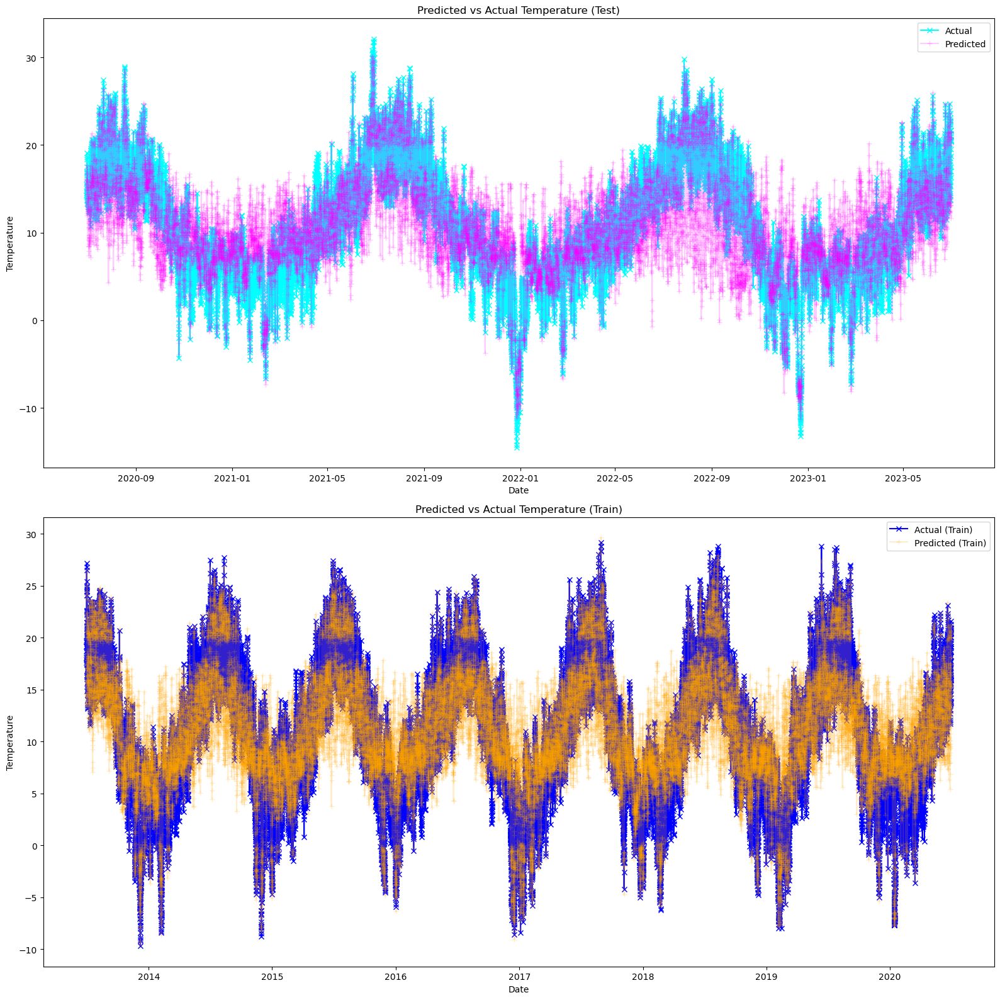

In [39]:
# Create the plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 16))

# First subplot: Test Data
axes[0].plot(X_test.index, y_test, label='Actual', marker='x', color='cyan')
axes[0].plot(X_test.index, y_test_pred.flatten(), label='Predicted', marker='+', color='magenta', alpha=.2)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Temperature')
axes[0].set_title('Predicted vs Actual Temperature (Test)')
axes[0].legend()

# Second subplot: Train Data
axes[1].plot(X_train.index, y_train, label='Actual (Train)', marker='x', color='blue')
axes[1].plot(X_train.index, y_train_pred.flatten(), label='Predicted (Train)', marker='+', color='orange', alpha=.2)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Temperature')
axes[1].set_title('Predicted vs Actual Temperature (Train)')
axes[1].legend()

plt.tight_layout()
plt.show()


The final model is performing well on the test data for three years. I will be adding Dew Point back into the model training and fitting to hopefully get more accurate results.

In [40]:
# Creating a new X and y for the model fitting to include Dew Point.
X_dew = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir'], axis=1)
y_dew = df['temperature']

In [41]:
X_train_dew = X_dew.loc[X.index <= "2020-06-30"]
X_test_dew = X_dew.loc[X.index > "2020-06-30"]
y_train_dew = y_dew.loc[y.index <= "2020-06-30"]
y_test_dew = y_dew.loc[y.index > "2020-06-30"]

In [49]:
scaler = StandardScaler()
X_train_dew_scaled = scaler.fit_transform(X_train_dew)

joblib.dump(scaler, 'stdscaler.pkl')

X_test_dew_scaled = scaler.transform(X_test_dew)

# Reshape the data
X_train_dew_reshaped = X_train_dew_scaled.reshape((X_train_dew_scaled.shape[0], 1, X_train_dew_scaled.shape[1]))
X_test_dew_reshaped = X_test_dew_scaled.reshape((X_test_dew_scaled.shape[0], 1, X_test_dew_scaled.shape[1]))

In [43]:
model_6_1_dew = Sequential([
    Input(shape=(1, 10)),  # Changed to expect 10 features
    LSTM(128),  # 128 LSTM units
    Dense(8, activation='relu'),  # Dense layer with 8 units and ReLU activation
    Dense(1, activation='linear')  # Output layer with 1 unit and linear activation
])

model_6_1_dew.compile(optimizer='adam', loss='mse')

In [44]:
model_6_1_dew.fit(X_train_dew_reshaped, y_train_dew, epochs=25, batch_size=32, verbose=0)

y_train_dew_pred = model_6_1_dew.predict(X_train_dew_reshaped)
y_test_dew_pred = model_6_1_dew.predict(X_test_dew_reshaped)

print("Training Data Evaluation:")
evaluate_model(y_train_dew, y_train_dew_pred, "Train")
print()
print()
print("Test Data Evaluation:")
evaluate_model(y_test_dew, y_test_dew_pred, "Test")

Training Data Evaluation:
Train MAE: 0.07714955753188076
Train MSE: 0.010228912242761286
Train RMSE: 0.10113808502617244
Train R^2: 0.9997399304040233


Test Data Evaluation:
Test MAE: 0.08626938946824134
Test MSE: 0.015968854433589967
Test RMSE: 0.12636793277406244
Test R^2: 0.999627522328848


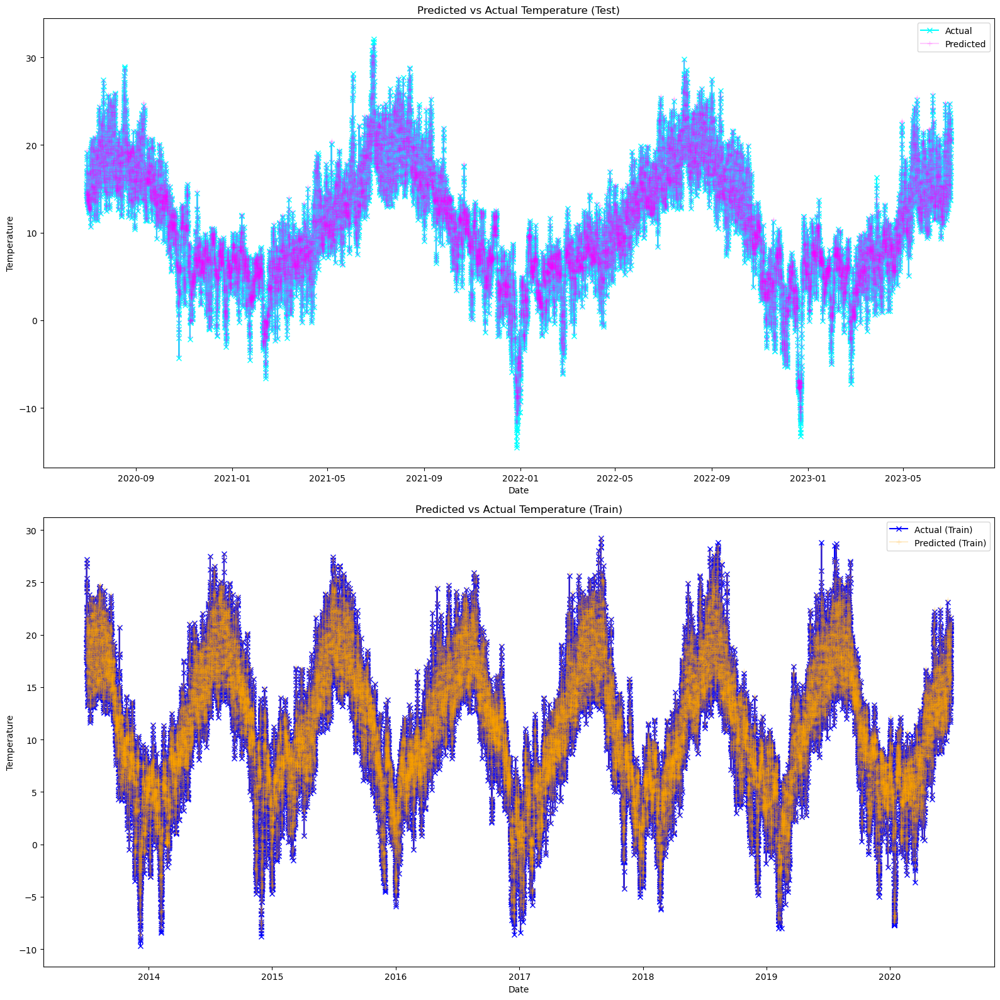

In [45]:
# Create the plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 16))

# First subplot: Test Data
axes[0].plot(X_test_dew.index, y_test_dew, label='Actual', marker='x', color='cyan')
axes[0].plot(X_test_dew.index, y_test_dew_pred.flatten(), label='Predicted', marker='+', color='magenta', alpha=.2)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Temperature')
axes[0].set_title('Predicted vs Actual Temperature (Test)')
axes[0].legend()

# Second subplot: Train Data
axes[1].plot(X_train_dew.index, y_train_dew, label='Actual (Train)', marker='x', color='blue')
axes[1].plot(X_train_dew.index, y_train_dew_pred.flatten(), label='Predicted (Train)', marker='+', color='orange', alpha=.2)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Temperature')
axes[1].set_title('Predicted vs Actual Temperature (Train)')
axes[1].legend()

plt.tight_layout()
plt.show()

Now that Dew Point is back in the model, the predictions are very accurate. This model has a very high R-Squared value like the Linear Regression and FB Prophet models did when Dew Point was included. However, LSTM is more accurate with the highest temperatures than the FB Prophet and Linear Regression models. After a lot of work, I can now save the model and push it into production.

In [46]:
model_6_1_dew.save('model_6_1_dew.h5')